# Requirements

In [1]:
!pip install keras
!pip install keras_preprocessing
!pip install tensorflow
!pip install kaggle
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.7 MB/s eta 0:00:00


# Libraries

In [2]:
# Data Science Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from datasets import Dataset


# Tensorflow Libraries
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers
from keras_preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import Model

# Torch Libraroes
import torch
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Subset

# System Libraries
from pathlib import Path
import os
import os.path
import random

# Visualization Libraries
import matplotlib.cm as cm
import cv2
import seaborn as sns
from PIL import Image, ImageChops, ImageEnhance

# Metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import itertools

# Model
from tensorflow.keras.applications import MobileNetV2,ResNet50, ResNet50V2
from transformers import ViTFeatureExtractor, ViTForImageClassification, Trainer, TrainingArguments

# Extra
import zipfile
from termcolor import colored
#from google.colab import drive
from collections import defaultdict, Counter

# Data

### Directory

In [3]:
!ls "/kaggle/input/dataset"
dir = "/kaggle/input/dataset"

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


AI_SD_art_nouveau    AI_SD_renaissance	baroque        romanticism
AI_SD_baroque	     AI_SD_romanticism	expressionism  surrealism
AI_SD_expressionism  AI_SD_surrealism	impressionism  ukiyo_e
AI_SD_impressionism  AI_SD_ukiyo-e	realism
AI_SD_realism	     art_nouveau	renaissance


### Selecting the Models
In this experiments, we only use Stable Diffusion

In [4]:
# List of classes to include (everything except AI_SD)
allowed_classes = [
    'AI_SD_art_nouveau', 'AI_SD_baroque', 'AI_SD_expressionism', 'AI_SD_impressionism',
    'AI_SD_realism', 'AI_SD_renaissance', 'AI_SD_romanticism',
    'AI_SD_surrealism', 'AI_SD_ukiyo-e',
    'art_nouveau', 'surrealism', 'baroque', 'ukiyo_e', 'expressionism', 'impressionism',
    'realism', 'renaissance', 'romanticism'
]

def create_filtered_df(folder_path, max_images_per_class=300):
    all_images = []
    for class_name in allowed_classes:
        class_path = os.path.join(folder_path, class_name)


        if os.path.exists(class_path):
            class_images = [(os.path.join(class_path, file_name), class_name) for file_name in os.listdir(class_path)]

            all_images.extend(class_images[:max_images_per_class])

    df = pd.DataFrame(all_images, columns=['file_path', 'label'])
    return df

dataset = create_filtered_df(dir)
dataset

,file_path,label
0,/kaggle/input/dataset/AI_SD_art_nouveau/0-2339...,AI_SD_art_nouveau
1,/kaggle/input/dataset/AI_SD_art_nouveau/0-1612...,AI_SD_art_nouveau
2,/kaggle/input/dataset/AI_SD_art_nouveau/0-1594...,AI_SD_art_nouveau
3,/kaggle/input/dataset/AI_SD_art_nouveau/0-1696...,AI_SD_art_nouveau
4,/kaggle/input/dataset/AI_SD_art_nouveau/0-2165...,AI_SD_art_nouveau
...,...,...
5395,/kaggle/input/dataset/romanticism/john-frederi...,romanticism
5396,/kaggle/input/dataset/romanticism/john-frederi...,romanticism
5397,/kaggle/input/dataset/romanticism/karl-bryullo...,romanticism
5398,/kaggle/input/dataset/romanticism/david-wilkie...,romanticism


# Exploratory Data Analysis

### Data Distribution

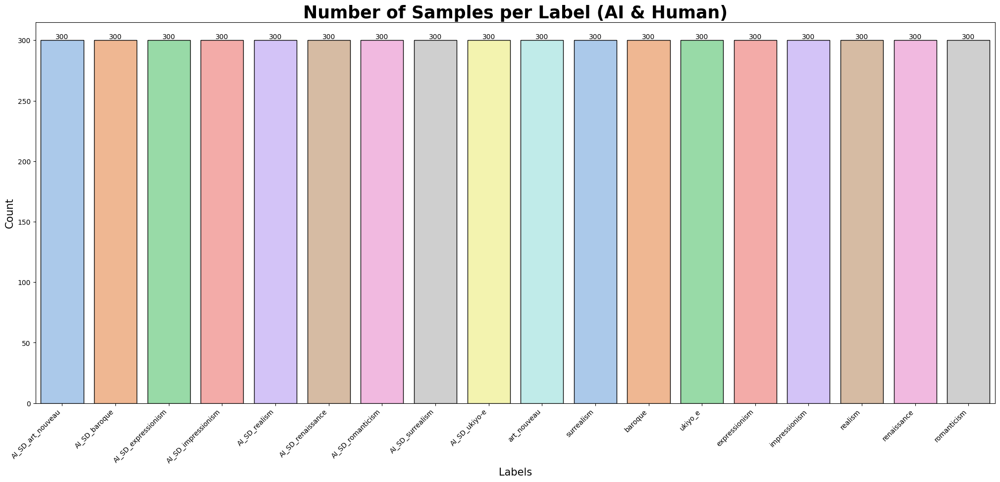

In [5]:
# Count the number of samples per label
label_counts = dataset['label'].value_counts().reset_index()
label_counts.columns = ['label', 'count']  # Rename columns for clarity

# Plotting
plt.figure(figsize=(25, 10))
ax = sns.barplot(data=label_counts, x='label', y='count', edgecolor='black', palette='pastel')

# Adding labels to the bars
for i in ax.containers:
    ax.bar_label(i)

# Set plot title and labels
plt.title('Number of Samples per Label (AI & Human)', fontsize=25, fontweight='bold')
plt.xlabel('Labels', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.show()


### Plot Random Image AI Generated & Human for each class

Available AI_LD classes:
['AI_SD_art_nouveau' 'AI_SD_baroque' 'AI_SD_expressionism'
 'AI_SD_impressionism' 'AI_SD_realism' 'AI_SD_renaissance'
 'AI_SD_romanticism' 'AI_SD_surrealism' 'AI_SD_ukiyo-e']

Available human classes:
['art_nouveau' 'surrealism' 'baroque' 'ukiyo_e' 'expressionism'
 'impressionism' 'realism' 'renaissance' 'romanticism']


/tmp/ipykernel_30/4169482620.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ai_sd_images['base_class'] = ai_sd_images['label'].apply(get_base_class_name)
/tmp/ipykernel_30/4169482620.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  human_images['base_class'] = human_images['label']  # Human images already have base class names
/tmp/ipykernel_30/4169482620.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = val

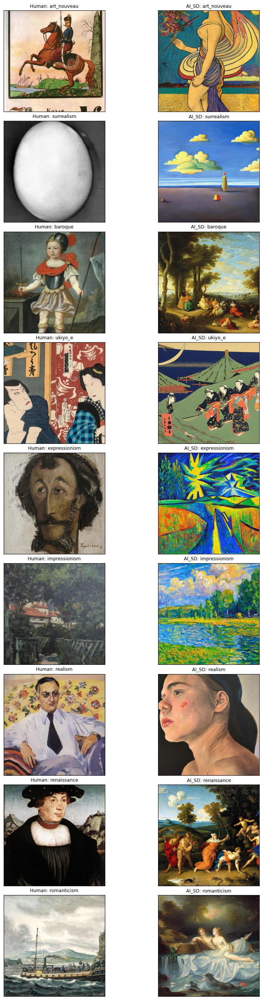

In [6]:
# Function to check if the label is an AI_LD label
def is_ai_sd(label):
    return 'AI_SD_' in label

# Function to remove the 'AI_LD_' prefix to get the base class name
def get_base_class_name(label):
    return label.replace('AI_SD_', '')

# Drop duplicates to get one sample per label
df_unique = dataset.copy().drop_duplicates(subset=['label']).reset_index()

# Split dataset into AI_LD images and human images (no AI_LD or AI_SD in label)
ai_sd_images = df_unique[df_unique['label'].apply(is_ai_sd)]
human_images = df_unique[~df_unique['label'].apply(lambda label: 'AI_LD_' in label or 'AI_SD_' in label)]

# Print available classes for debugging
print("Available AI_LD classes:")
print(ai_sd_images['label'].unique())
print("\nAvailable human classes:")
print(human_images['label'].unique())

# Create a base class name column for both human and AI_LD images
ai_sd_images['base_class'] = ai_sd_images['label'].apply(get_base_class_name)
human_images['base_class'] = human_images['label']  # Human images already have base class names
ai_sd_images['base_class'] = ai_sd_images['base_class'].replace('ukiyo-e', 'ukiyo_e')

# Merge AI_LD and human images on the base class name
paired_classes = pd.merge(human_images, ai_sd_images, on='base_class', suffixes=('_human', '_ai_sd'), how='inner')

# Check if we have valid pairs
if paired_classes.empty:
    print("No matching AI_LD and Human pairs found.")
else:
    # Number of paired classes
    num_classes = len(paired_classes)

    # Create the plot with 2 images (human and AI_LD) per row for each class
    fig, axes = plt.subplots(num_classes, 2, figsize=(10, num_classes * 3),
                             subplot_kw={'xticks': [], 'yticks': []})

    # Plot images side by side for each class (human and AI_LD)
    for i in range(num_classes):
        # Human image
        axes[i, 0].imshow(plt.imread(paired_classes.file_path_human[i]))
        axes[i, 0].set_title(f"Human: {paired_classes.base_class[i]}", fontsize=9)

        # AI_LD image
        axes[i, 1].imshow(plt.imread(paired_classes.file_path_ai_sd[i]))
        axes[i, 1].set_title(f"AI_SD: {paired_classes.base_class[i]}", fontsize=9)

    # Adjust layout
    plt.tight_layout(pad=0.5)
    plt.show()


# Data Preprocessing

### Define Transformation

In [7]:
# For Training
transform = transforms.Compose([
    transforms.Resize((224, 224)),                      # Resize image
    transforms.RandomCrop(size=(224, 224), padding=4),  # Randomly crop image
    transforms.RandomRotation(degrees=15),              # Randomly rotate the image
    transforms.RandomHorizontalFlip(),                  # Random horizontal flip
    transforms.RandomVerticalFlip(p=0.5),               # Random vertical flip
    transforms.ToTensor(),
])

# For validation and test
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize image to fixed size
    transforms.ToTensor(),          # Convert to tensor
])


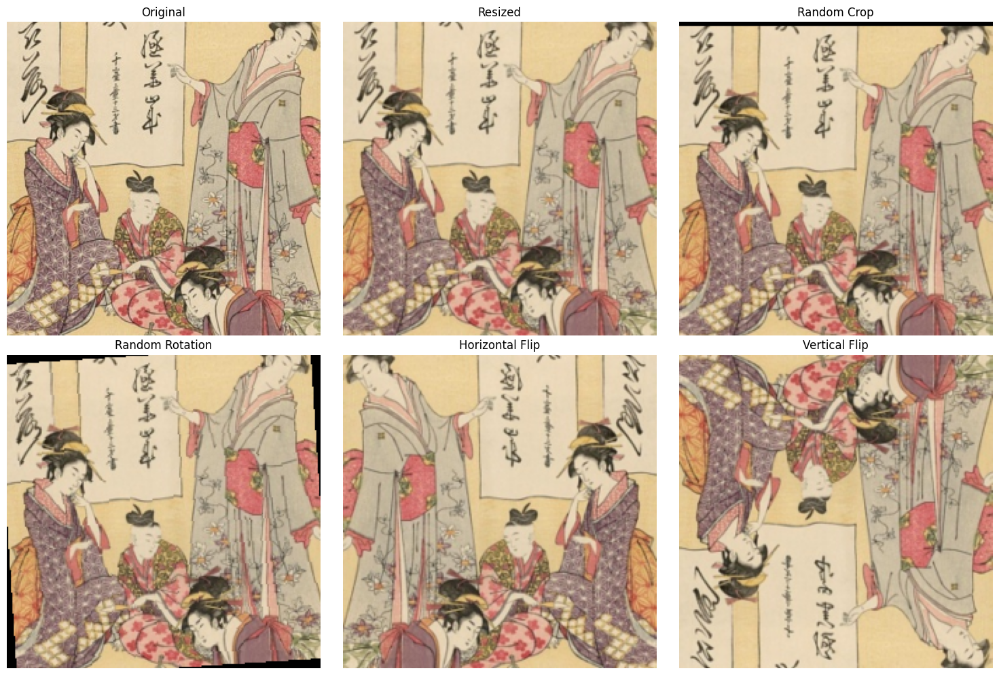

In [8]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image

# Load the original image (replace with your actual image path)
original_image = Image.open('/kaggle/input/dataset/ukiyo_e/chokosai-eisho_73.jpg')

# Create individual transformations (no need for ToTensor for visualization)
resize_transform = transforms.Resize((224, 224))
crop_transform = transforms.RandomCrop(size=(224, 224), padding=4)
rotate_transform = transforms.RandomRotation(degrees=15)
h_flip_transform = transforms.RandomHorizontalFlip()
v_flip_transform = transforms.RandomVerticalFlip(p=0.5)

# Apply each transformation separately
resized_image = resize_transform(original_image)
cropped_image = crop_transform(resized_image)
rotated_image = rotate_transform(resized_image)
h_flipped_image = h_flip_transform(resized_image)
v_flipped_image = v_flip_transform(resized_image)

# Create a list of all transformed images for visualization
transformed_images = [
    original_image,  # Original
    resized_image,   # After Resize
    cropped_image,   # After Random Crop
    rotated_image,   # After Random Rotation
    h_flipped_image, # After Horizontal Flip
    v_flipped_image  # After Vertical Flip
]

# Now we can plot the original and transformed images
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

# Titles for each image
titles = ["Original", "Resized", "Random Crop", "Random Rotation", "Horizontal Flip", "Vertical Flip"]

# Plot the images
for i, img in enumerate(transformed_images):
    axes[i].imshow(img)  # Images are still PIL Images
    axes[i].set_title(titles[i])
    axes[i].axis('off')

plt.tight_layout()
plt.show()


### Taking 1000 images from each class

In [9]:
full_dataset = datasets.ImageFolder(root='/kaggle/input/dataset')

class_indices = {class_idx: [] for class_idx in range(len(full_dataset.classes))}

for idx, (_, class_idx) in enumerate(full_dataset.imgs):
    class_indices[class_idx].append(idx)

selected_indices = []
for class_idx, indices in class_indices.items():
    selected_indices.extend(random.sample(indices, min(len(indices), 1000)))  # Take up to 1000 images

limited_dataset = Subset(full_dataset, selected_indices)
print(f'Total images selected: {len(selected_indices)}')


Total images selected: 18000


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


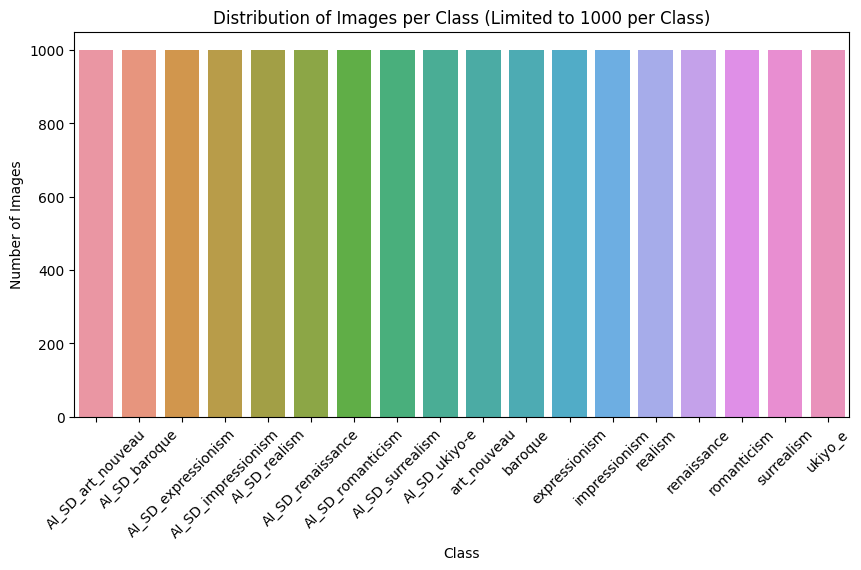

In [10]:
class_counts = Counter(full_dataset.imgs[i][1] for i in selected_indices)

# Visualize the distribution
class_labels = [full_dataset.classes[i] for i in class_counts.keys()]
counts = list(class_counts.values())

plt.figure(figsize=(10, 5))
sns.barplot(x=class_labels, y=counts)
plt.title('Distribution of Images per Class (Limited to 1000 per Class)')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()

### Split the Data

In [11]:
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Calculate lengths for each split
train_len = int(train_ratio * len(full_dataset))
val_len = int(val_ratio * len(full_dataset))
test_len = len(full_dataset) - train_len - val_len

train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_len, val_len, test_len])

train_dataset.dataset.transform = transform 
val_dataset.dataset.transform = test_transform    
test_dataset.dataset.transform = test_transform    

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

print(f'Training set size: {len(train_dataset)}')
print(f'Validation set size: {len(val_dataset)}')
print(f'Test set size: {len(test_dataset)}')

Training set size: 14400
Validation set size: 1800
Test set size: 1800


# Modeling

### Model

In [12]:
import torch
from transformers import ViTForImageClassification, ViTFeatureExtractor

num_classes = 18
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224",
    num_labels=num_classes,
    ignore_mismatched_sizes=True
)

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)  # Adjust learning rate as needed
criterion = nn.CrossEntropyLoss()

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([18]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([18, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Training

In [13]:
import torch

# Training and validation loop
epochs = 30  # Number of epochs
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(epochs):
    # ---- Training Phase ----
    model.train()  # Set model to training mode
    total_train_loss = 0
    correct_train = 0
    total_train = 0

    for batch in train_loader:
        inputs, labels = batch[0].to(device), batch[1].to(device)

        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)

        # Check if outputs are in the expected format
        if hasattr(outputs, 'logits'):
            outputs = outputs.logits  # Extract logits if necessary

        # Calculate loss
        loss = criterion(outputs, labels)
        total_train_loss += loss.item()

        # Backpropagation and optimization
        loss.backward()
        optimizer.step()

        # Calculate training accuracy
        _, predicted = torch.max(outputs, 1)
        correct_train += (predicted == labels).sum().item()
        total_train += labels.size(0)

    avg_train_loss = total_train_loss / len(train_loader)
    train_accuracy = correct_train / total_train if total_train > 0 else 0

    # ---- Validation Phase ----
    model.eval()  # Set model to evaluation mode
    total_val_loss = 0
    correct_val = 0
    total_val = 0

    with torch.no_grad():
        for batch in val_loader:
            inputs, labels = batch[0].to(device), batch[1].to(device)

            outputs = model(inputs)
            if hasattr(outputs, 'logits'):
                outputs = outputs.logits  # Extract logits if necessary

            loss = criterion(outputs, labels)
            total_val_loss += loss.item()

            # Calculate validation accuracy
            _, predicted = torch.max(outputs, 1)
            correct_val += (predicted == labels).sum().item()
            total_val += labels.size(0)

    avg_val_loss = total_val_loss / len(val_loader) if len(val_loader) > 0 else 0
    val_accuracy = correct_val / total_val if total_val > 0 else 0

    # Store losses and accuracies
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)

    # Print the metrics for each epoch
    print(f"Epoch {epoch + 1}/{epochs}, "
          f"Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, "
          f"Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")


Epoch 1/30, Train Loss: 1.2822, Train Accuracy: 0.6324, Val Loss: 0.7313, Val Accuracy: 0.7539
Epoch 2/30, Train Loss: 0.5837, Train Accuracy: 0.8084, Val Loss: 0.5898, Val Accuracy: 0.7956
Epoch 3/30, Train Loss: 0.4275, Train Accuracy: 0.8612, Val Loss: 0.5561, Val Accuracy: 0.8089
Epoch 4/30, Train Loss: 0.3036, Train Accuracy: 0.9080, Val Loss: 0.5289, Val Accuracy: 0.8178
Epoch 5/30, Train Loss: 0.1926, Train Accuracy: 0.9508, Val Loss: 0.5484, Val Accuracy: 0.8167
Epoch 6/30, Train Loss: 0.1026, Train Accuracy: 0.9834, Val Loss: 0.5683, Val Accuracy: 0.8122
Epoch 7/30, Train Loss: 0.0470, Train Accuracy: 0.9961, Val Loss: 0.5855, Val Accuracy: 0.8211
Epoch 8/30, Train Loss: 0.0200, Train Accuracy: 0.9997, Val Loss: 0.6364, Val Accuracy: 0.8178
Epoch 9/30, Train Loss: 0.0095, Train Accuracy: 1.0000, Val Loss: 0.6776, Val Accuracy: 0.8206
Epoch 10/30, Train Loss: 0.0054, Train Accuracy: 1.0000, Val Loss: 0.7226, Val Accuracy: 0.8167
Epoch 11/30, Train Loss: 0.0035, Train Accuracy: 

### Plot Training

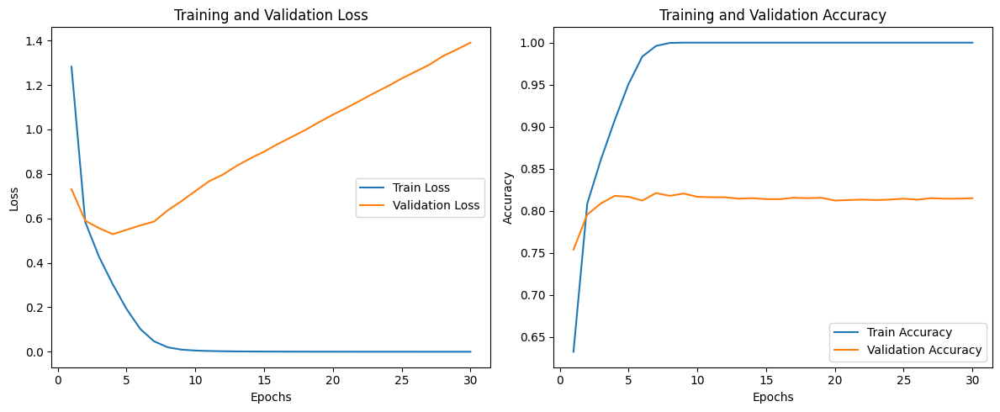

In [14]:
epochs_range = range(1, epochs + 1)

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_losses, label='Train Loss')
plt.plot(epochs_range, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_accuracies, label='Train Accuracy')
plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

### Model Evaluation

In [15]:
# Evaluate the fine-tuned model on the test set
model.eval()
predictions = []
true_labels = []
for batch in test_loader:
    batch = tuple(t.to(device) for t in batch)
    inputs, labels = batch
    with torch.no_grad():
        outputs = model(inputs)
    logits = outputs.logits
    predicted_labels = torch.argmax(logits, dim=1).cpu().numpy()
    predictions.extend(predicted_labels)
    true_labels.extend(labels.cpu().numpy())

In [16]:
from sklearn.metrics import classification_report, accuracy_score
accuracy = accuracy_score(true_labels, predictions)
print(f"Test Accuracy: {accuracy}")

Test Accuracy: 0.8088888888888889


### Confusion Matrix

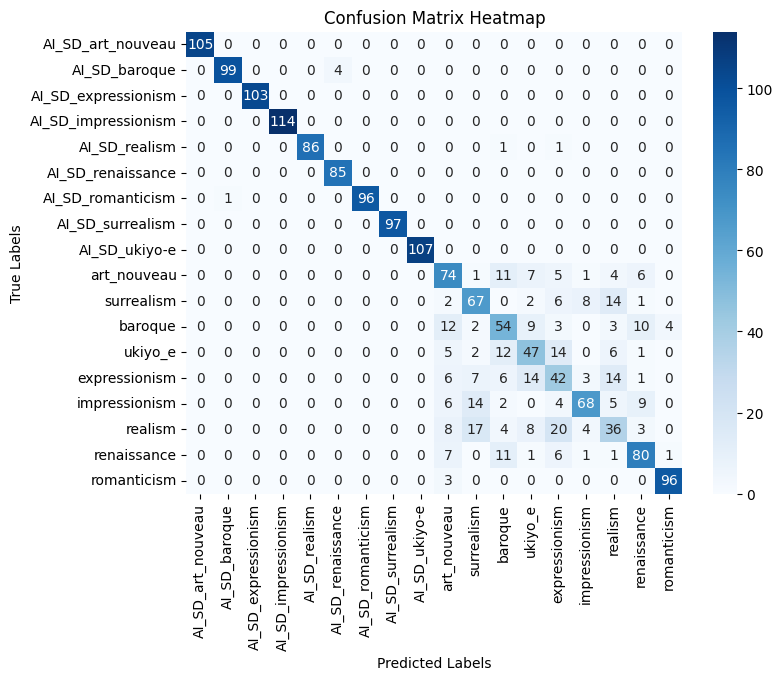

In [17]:
cm = confusion_matrix(true_labels, predictions)

# Define the labels for the x and y axes
labels = dataset['label'].unique()  # Assuming this is a list of label names

# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=labels,
            yticklabels=labels)

# Add labels and title
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')

# Show the plot
plt.show()

In [18]:
# Path to save the model in Kaggle's working directory
model_save_path = "/kaggle/working/vit_image_classification.pth"

# Save the model's state dictionary and optimizer's state dictionary
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'epoch': epoch,  # Optional: save the current epoch
    'loss': loss     # Optional: save the current loss
}, model_save_path)

print(f"Model saved to {model_save_path}")


Model saved to /kaggle/working/vit_image_classification.pth


### Random Image Predicting

In [19]:
# Recreate the model architecture
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224",
    num_labels=num_classes,
    ignore_mismatched_sizes=True
)

# Load the saved state dictionary
checkpoint = torch.load('vit_image_classification.pth')

# Load model weights
model.load_state_dict(checkpoint['model_state_dict'])

# If resuming training, load the optimizer state too
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([18]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([18, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/535128864.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. Th

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTSdpaAttention(
            (attention): ViTSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fe

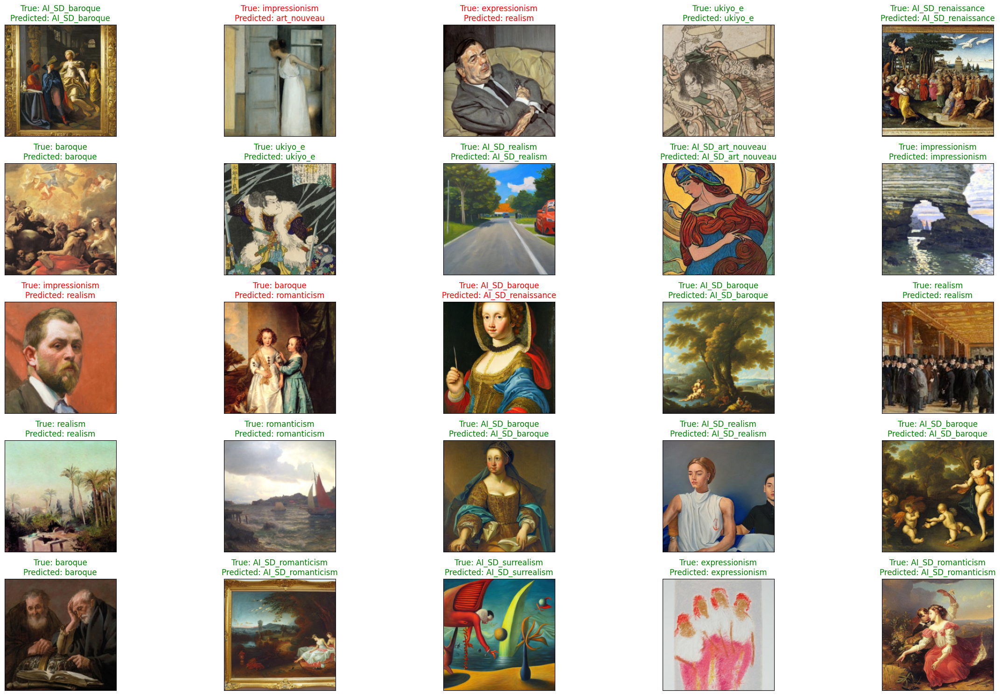

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Assuming full_dataset is already defined, extract class labels
class_labels = full_dataset.classes  # Get the class names from the ImageFolder dataset

# Set model to evaluation mode
model.eval()

# Generate predictions for the entire test set
all_pred_labels = []
all_true_labels = []
all_images = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        # Get the model's predictions
        outputs = model(inputs)
        if hasattr(outputs, 'logits'):  # For HuggingFace models like ViT
            outputs = outputs.logits
        
        _, preds = torch.max(outputs, 1)  # Take the argmax to get predicted class indices
        
        all_pred_labels.extend(preds.cpu().numpy())
        all_true_labels.extend(labels.cpu().numpy())
        all_images.extend(inputs.cpu())  # Save images to display later

# Convert lists to arrays
all_pred_labels = np.array(all_pred_labels)
all_true_labels = np.array(all_true_labels)

# Randomly select indices for visualization
num_images_to_display = 25
random_indices = np.random.choice(len(all_images), num_images_to_display, replace=False)

# Create a 5x5 plot grid
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(25, 15), subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    idx = random_indices[i]
    
    # Get the image, true label, and predicted label for this index
    img = all_images[idx].permute(1, 2, 0).numpy()  # Convert from Tensor to NumPy array for plotting
    true_label_idx = all_true_labels[idx]  # Numeric true label
    pred_label_idx = all_pred_labels[idx]  # Numeric predicted label

    # Map numeric labels to class names
    true_label = class_labels[true_label_idx]  # Map true label index to class name
    pred_label = class_labels[pred_label_idx]  # Map predicted label index to class name

    # Plot the image
    ax.imshow(img)

    # Set title with true and predicted labels
    color = "green" if true_label == pred_label else "red"
    ax.set_title(f"True: {true_label}\nPredicted: {pred_label}", color=color)

plt.tight_layout()
plt.show()
